In [ ]:
import os
os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cuda'


In [ ]:
IMG_C,IMG_H,IMG_W = 3, 128,128

In [ ]:
import glob
png_list = glob.glob("animeface-character-dataset/thumb/*/*.png")

In [ ]:
from PIL import Image
import numpy as np
from IPython.display import display
def showX(X, rows=1):
    assert X.shape[0]%rows == 0
    int_X = ( (X+1)/2*255).clip(0,255).astype('uint8')
    int_X = np.moveaxis(int_X, 1, 3)
    int_X = int_X.reshape(rows, -1, IMG_H, IMG_W,3)
    int_X = int_X.swapaxes(1,2).reshape(rows*IMG_H,-1, 3)
    display(Image.fromarray(int_X))

In [ ]:
train_X = np.ones((len(png_list), IMG_C, IMG_H,IMG_W), dtype='float32')
for i, png in enumerate(png_list):
    img = Image.open(png)
    img.thumbnail((IMG_H,IMG_W))
    img = np.array(img)/255*2-1
    h, w = img.shape[:2]
    y, x = (IMG_H-h)//2, (IMG_W-w)//2
    img = img.swapaxes(1,2).swapaxes(0,1)
    #print(img.shape, y,x,h,w)
    train_X[i, :, y:y+h, x:x+w] = img[:3]

In [ ]:
train_X = np.concatenate([train_X[:,:,:,::-1], train_X])
np.random.shuffle(train_X)
showX(train_X[:100], 10)

In [ ]:
import numpy as np
import theano
import theano.tensor as T
import lasagne
from lasagne.layers import DenseLayer, DropoutLayer, ReshapeLayer, InputLayer, FlattenLayer, Upscale2DLayer, LocalResponseNormalization2DLayer
floatX = theano.config.floatX
from lasagne.layers import MaxPool2DLayer, Conv2DLayer, TransposedConv2DLayer
from lasagne.layers import batch_norm

In [ ]:
conv_init = lasagne.init.Normal(0.05, 0)
gamma_init = lasagne.init.Normal(0.02, 1)

In [ ]:
def DCGAN_D(isize, nz, nc, ndf, n_extra_layers=0):
    _ = InputLayer(shape=(None, nc, isize, isize))
    _ = Conv2DLayer(_, num_filters=ndf, filter_size=4, stride=2, pad=1, b=None, W=conv_init, flip_filters=False,
               name = 'initial.conv.{0}-{1}'.format(nc, ndf), 
                nonlinearity=lasagne.nonlinearities.LeakyRectify(0.2))
    csize, cndf = isize // 2, ndf
    while csize > 5:
        in_feat = cndf
        out_feat = cndf*2
        _ = Conv2DLayer(_, num_filters=out_feat, filter_size=4, stride=2, pad=1, b=None, W=conv_init, 
                                   flip_filters=False,
               name = 'pyramid.{0}-{1}.conv'.format(in_feat, out_feat), 
                nonlinearity=lasagne.nonlinearities.LeakyRectify(0.2))
        if 0: # change this line to turn on batch_norm
            _ = batch_norm(_, epsilon=1e-5)
        csize, cndf = csize//2, cndf*2
        
    _ = Conv2DLayer(_, num_filters=1, filter_size=csize, stride=1, pad=0, b=None, W=conv_init, 
                    flip_filters=False,
               name = 'final.{0}-{1}.conv'.format(cndf, 1), 
                nonlinearity=None)
    _ = FlattenLayer(_)
    return _


In [ ]:
def DCGAN_G(isize, nz, nc, ngf, n_extra_layers=0):
    cngf= ngf//2
    tisize = isize
    while tisize > 5:
        cngf = cngf * 2
        tisize = tisize // 2
    _ = InputLayer(shape=(None, nz))
    _ = ReshapeLayer(_, (-1, nz, 1,1))
    _ = TransposedConv2DLayer(_, num_filters=cngf, filter_size=tisize, stride=1, crop=0, b=None, 
                              W=conv_init,
               name =  'initial.{0}-{1}.convt'.format(nz, cngf))
    _ = batch_norm(_, epsilon=1e-5)
    csize, cndf = tisize, cngf
    
    while csize < isize//2:
        in_feat = cngf
        out_feat = cngf//2
        _ = TransposedConv2DLayer(_, num_filters=out_feat, filter_size=4, stride=2, crop=1, b=None, W=conv_init,
               name = 'pyramid.{0}-{1}.convt'.format(in_feat, out_feat))
        _ = batch_norm(_, epsilon=1e-5)
        csize, cngf = csize*2, cngf//2
    _ = TransposedConv2DLayer(_, num_filters=nc, filter_size=4, stride=2, crop=1, b=None, W=conv_init,
               name = 'final.{0}-{1}.convt'.format(cngf, nc), nonlinearity=lasagne.nonlinearities.tanh)       
    return _


In [ ]:
nc = IMG_C
nz = 32
ngf = 64
ndf = 64
n_extra_layers = 0
Diters = 5
assert IMG_H == IMG_W
imageSize = IMG_H
batchSize = 64
lrD = 0.00005*10
lrG = 0.00005*10


In [ ]:
netD = DCGAN_D(imageSize, nz, nc, ndf, n_extra_layers)
for l in lasagne.layers.get_all_layers(netD):
    print(l.name,  l.output_shape)

In [ ]:
netG = DCGAN_G(imageSize, nz, nc, ngf, n_extra_layers)
for l in lasagne.layers.get_all_layers(netG):
    print(l.name,  l.output_shape)

In [ ]:
input_var_D = lasagne.layers.get_all_layers(netD)[0].input_var
input_var_G = lasagne.layers.get_all_layers(netG)[0].input_var
ϵ = T.TensorType(dtype=floatX,broadcastable=(False, True, True, True))()


In [ ]:
no_bn_avg = dict(       batch_norm_update_averages=False,
                       batch_norm_use_averages=False)
output_D = lasagne.layers.get_output(netD, **no_bn_avg)
output_G = lasagne.layers.get_output(netG, **no_bn_avg)

output_D_fake = lasagne.layers.get_output(netD, inputs=output_G, **no_bn_avg)

In [ ]:
mixed_X = (ϵ * output_G) + (1-ϵ) * input_var_D

In [ ]:
output_D_mixed = lasagne.layers.get_output(netD, inputs=mixed_X, **no_bn_avg)

In [ ]:
loss_mixed = output_D_mixed.mean()
grad_mixed = T.grad(loss_mixed, mixed_X)
norm_grad_mixed = T.sqrt(T.sum(T.square(grad_mixed),axis=[1,2,3]))
grad_penalty = T.mean(T.square(norm_grad_mixed -1))

In [ ]:
loss_D_real = output_D.mean()
loss_D_fake = output_D_fake.mean()
loss_D = loss_D_fake - loss_D_real + 10 * grad_penalty
loss_G = -loss_D_fake


params_netD = lasagne.layers.get_all_params(netD, trainable=True) 
params_netG = lasagne.layers.get_all_params(netG, trainable=True)
#optimize_G = lasagne.updates.rmsprop(loss_G, params_netG, learning_rate=lrG)
optimize_G = lasagne.updates.adam(loss_G, params_netG, learning_rate=lrG, beta1=0)
#optimize_D = lasagne.updates.rmsprop(loss_D, params_netD, learning_rate=lrD)
optimize_D = lasagne.updates.adam(loss_D, params_netD, learning_rate=lrD, beta1=0)
train_G_fn =  theano.function([input_var_G], [loss_G], updates=optimize_G)
train_D_fn = theano.function([input_var_D, input_var_G, ϵ], [loss_D, loss_D_real, loss_D_fake], 
                                         updates=optimize_D)
generator_fn = theano.function([input_var_G], output_G)

In [ ]:
fixed_noise = np.random.normal(size=(batchSize, nz)).astype('float32')

[55/500][220/452][4500] Loss_D: -22147.007812 Loss_G: 5205.692383 Loss_D_real: 17162.283203 Loss_D_fake -24685.593750 10985.896161794662


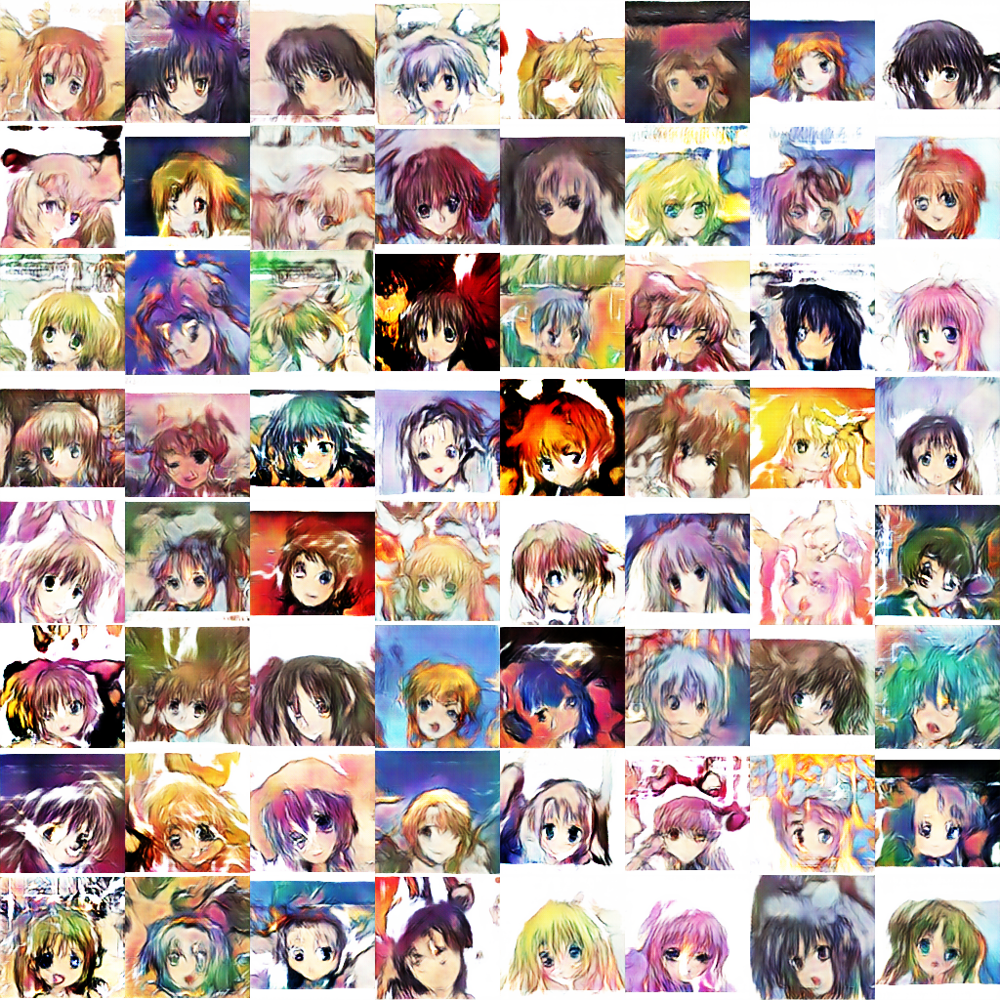

[61/500][85/452][5000] Loss_D: -16620.376953 Loss_G: 21055.664062 Loss_D_real: 28669.462891 Loss_D_fake -7027.671875 12120.867268562317


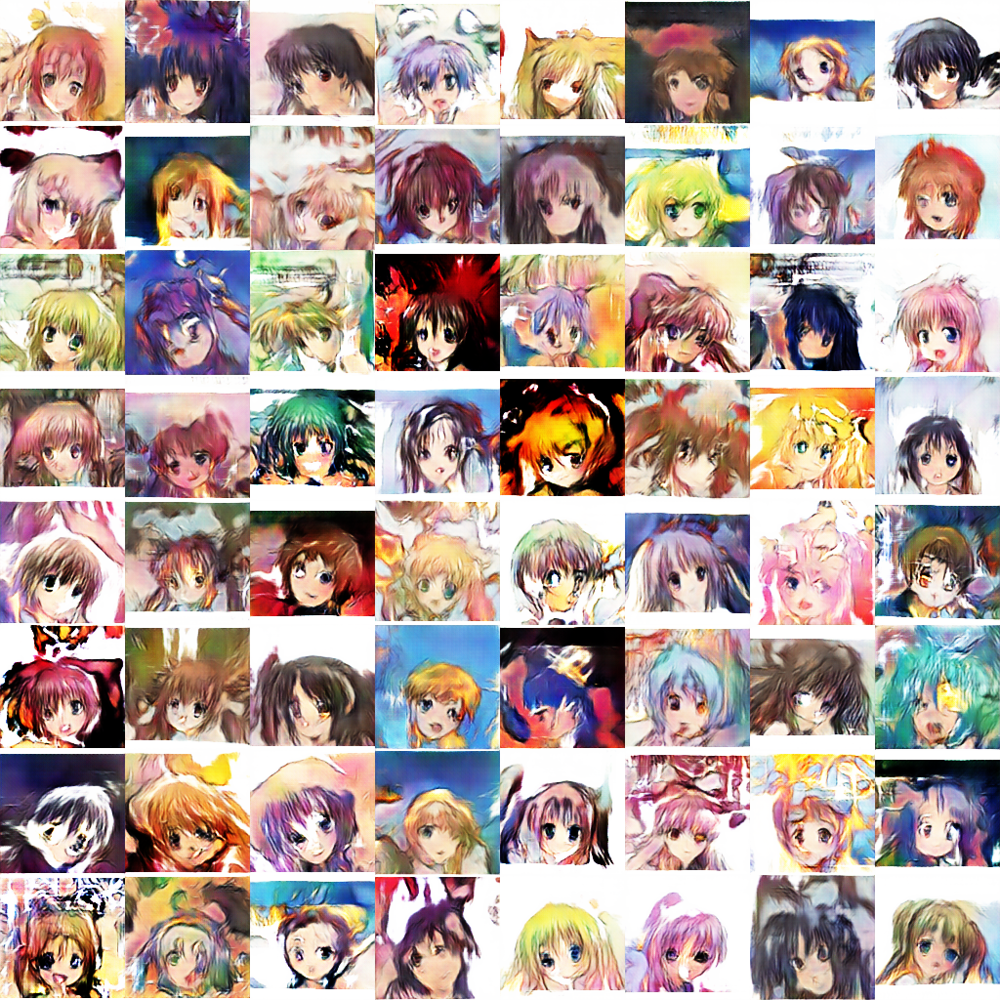

[66/500][405/452][5500] Loss_D: -20660.664062 Loss_G: -11161.654297 Loss_D_real: 40627.445312 Loss_D_fake 2548.008789 13255.253911018372


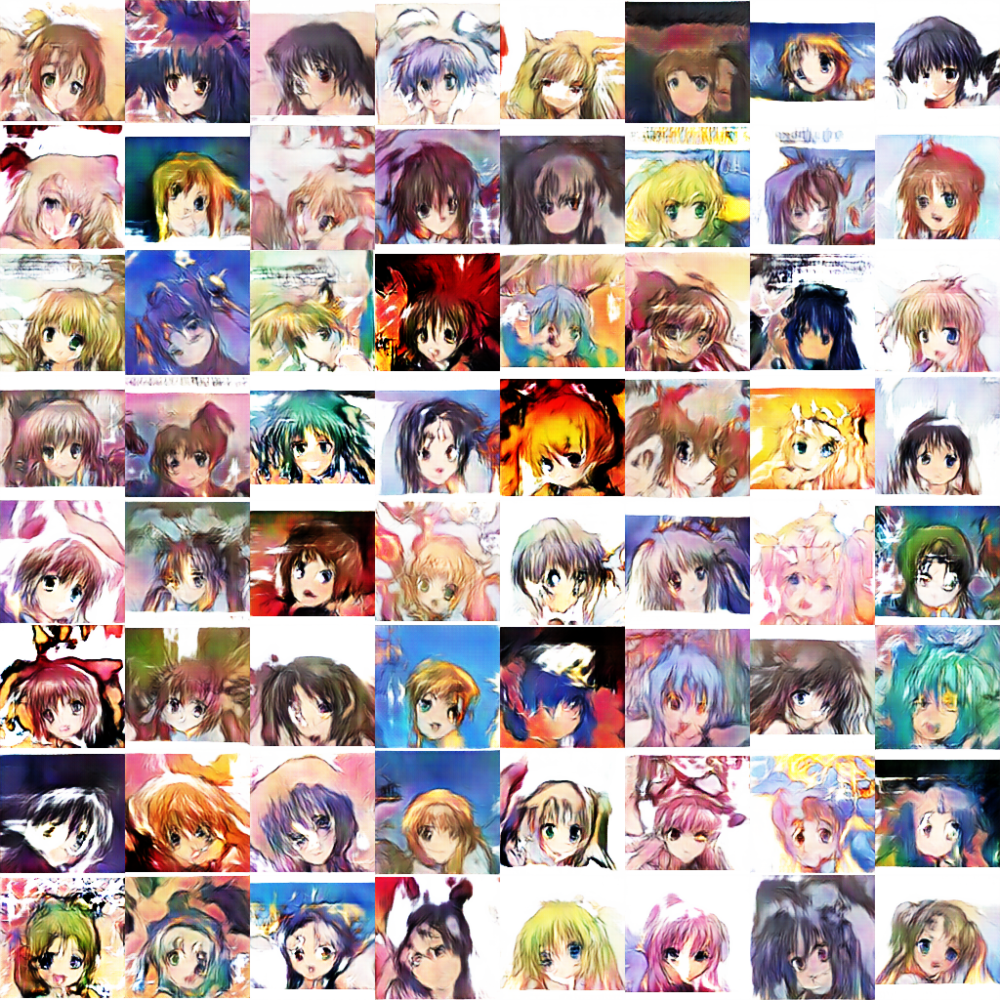

[72/500][220/452][6000] Loss_D: -19059.855469 Loss_G: -13079.416992 Loss_D_real: 49112.257812 Loss_D_fake 12395.573242 14369.95417022705


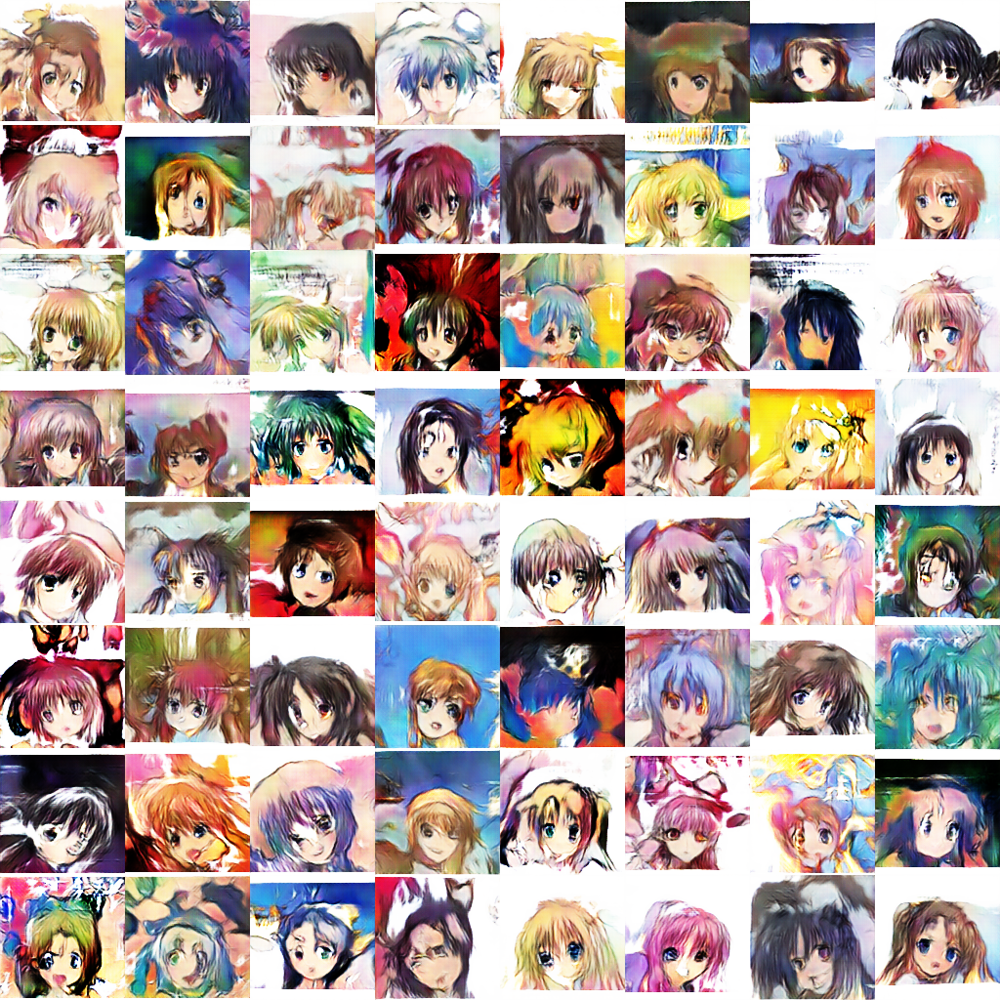

[78/500][85/452][6500] Loss_D: -16535.837891 Loss_G: -5846.060059 Loss_D_real: 26705.304688 Loss_D_fake -7135.902344 15504.872006893158


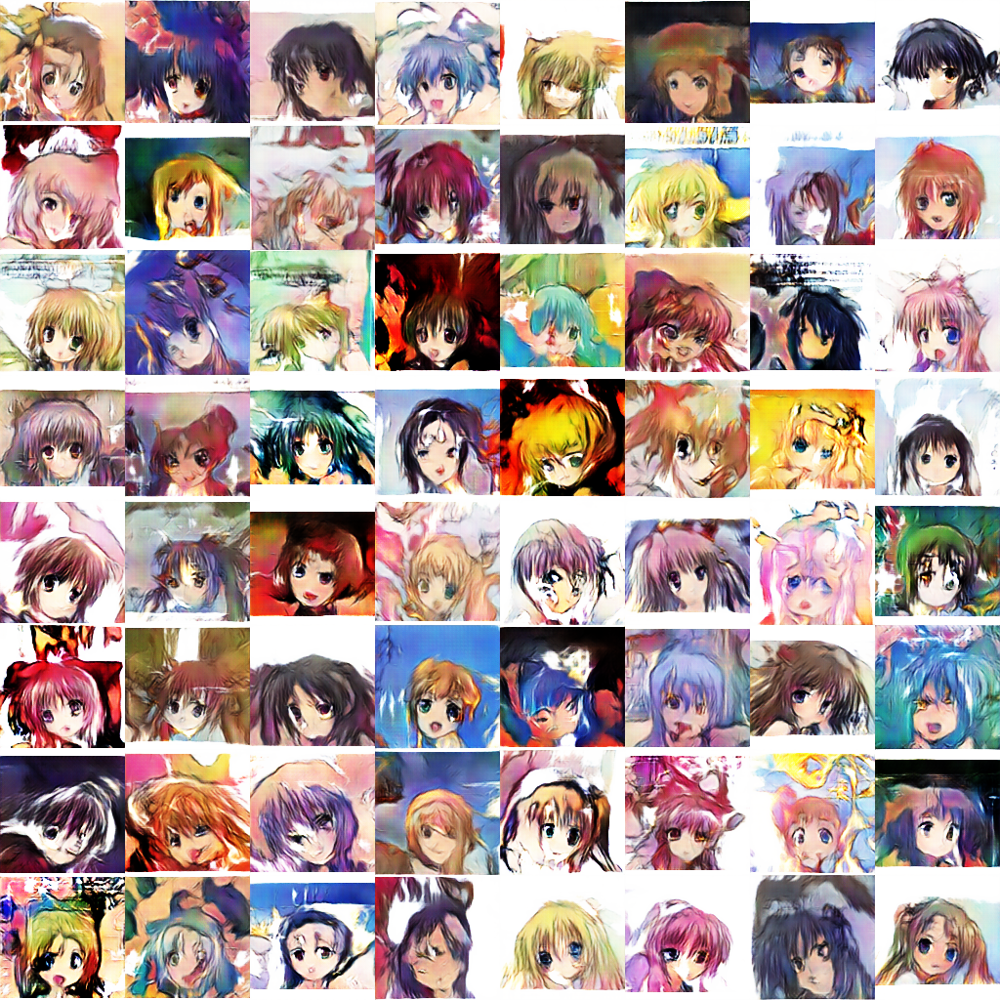

In [ ]:
import time
t0 = time.time()
niter = 500
gen_iterations = 0
for epoch in range(niter):
    i = 0
    #  每個 epoch 洗牌一下
    np.random.shuffle(train_X)
    batches = train_X.shape[0]//batchSize
    while i < batches:
        if gen_iterations < 25 or gen_iterations %500 == 0:
            _Diters = 100
        else:
            _Diters = Diters
        j = 0
        while j < _Diters and i < batches:
            j+=1       
            #clamp_D_fn()
            real_data = train_X[i*batchSize:(i+1)*batchSize]
            i+=1        
            noise  = np.random.normal(size=(batchSize, nz)).astype('float32')
            random_epsilon = np.random.uniform(size=(batchSize, 1,1,1)).astype('float32')
            errD, errD_real, errD_fake = train_D_fn(real_data, noise, random_epsilon)
        noise = np.random.normal(size=(batchSize, nz)).astype('float32')        
        errG = train_G_fn(noise)[0]
        gen_iterations+=1
        if gen_iterations%500==0:
            print('[%d/%d][%d/%d][%d] Loss_D: %f Loss_G: %f Loss_D_real: %f Loss_D_fake %f'
            % (epoch, niter, i, batches, gen_iterations,
            errD, errG, errD_real, errD_fake), time.time()-t0)
        if gen_iterations%500 == 0:            
            fake = generator_fn(fixed_noise)
            showX(fake, 8)
        

In [ ]:
fake = generator_fn(fixed_noise)
showX(fake, 8)